In [1]:
import sys
sys.path.append('../src/')

from pdb2mrc import PDB2MRC
import torch
from plotting_tools import *
import numpy as np
import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2

In [2]:
fftn = lambda array: torch.fft.fftshift(torch.fft.fftn(torch.fft.ifftshift(array)))
ifftn = lambda array: torch.fft.fftshift(torch.fft.ifftn(torch.fft.ifftshift(array)))

## Instantiate class

In [3]:
pdb_code = '6j6j'
pm = PDB2MRC(pdb_code)

## Download PDB file

In [4]:
pm.fetch_pdb()

PDB file saved to: ./pdb-data/6j6j.cif


## Compute particle potential

In [5]:
pm.build_particle(n=200, dx=0.5)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00,  5.30it/s]


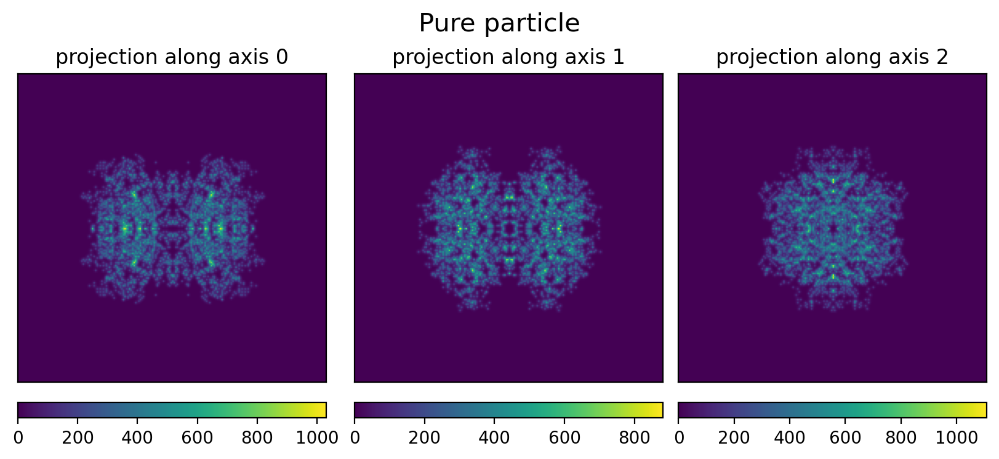

In [6]:
plot3d(pm.particle, title='Pure particle')

## ice

In [7]:
pm.solvate(niter=5)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:20<00:00,  4.17s/it]


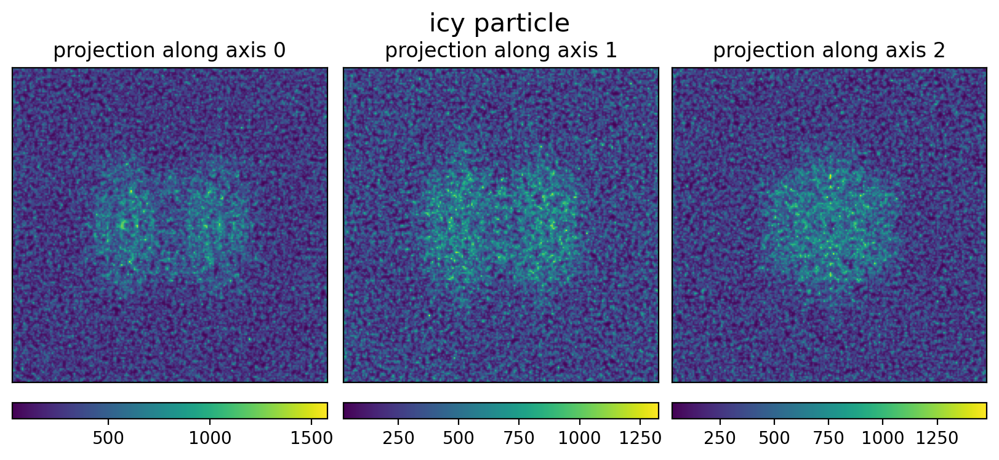

In [8]:
plot3d(pm.icy_particle, title='icy particle')

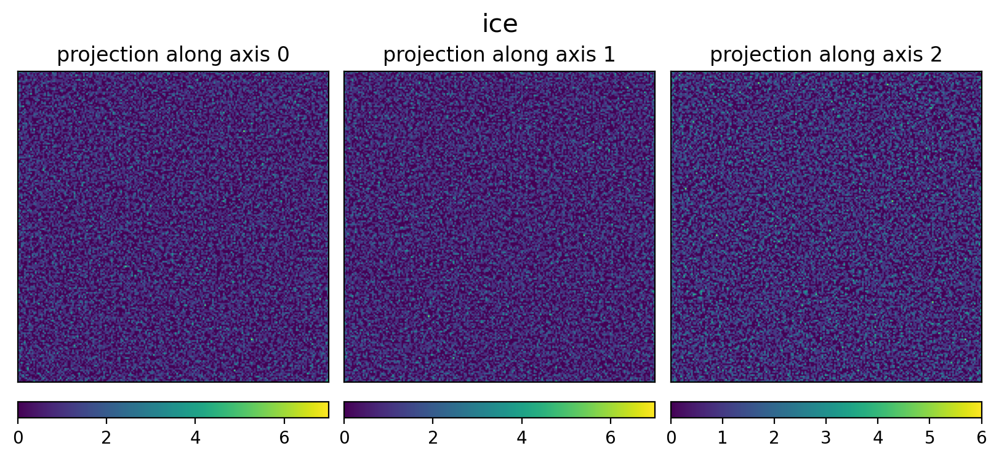

In [9]:
plot3d(pm.icecube_deltas, title='ice')

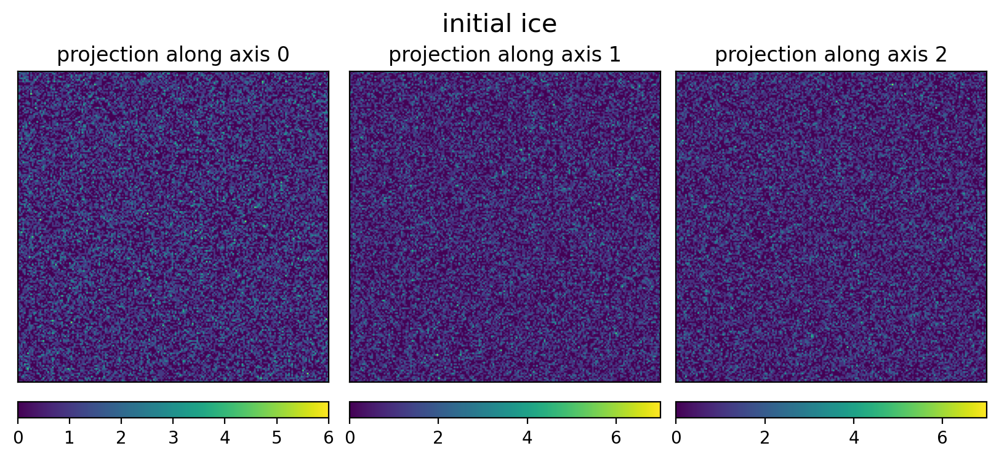

In [10]:
plot3d(pm.icemaker.ice_vol_init, title='initial ice')

In [11]:
prev_ice_vol = pm.icemaker.ice_vol_init.clone()
ice_vol_f = fftn(prev_ice_vol)

# amplitude multiplication
ice_vol_f *= pm.icemaker.interp_f_kernel

new_ice = torch.abs(ifftn(ice_vol_f))

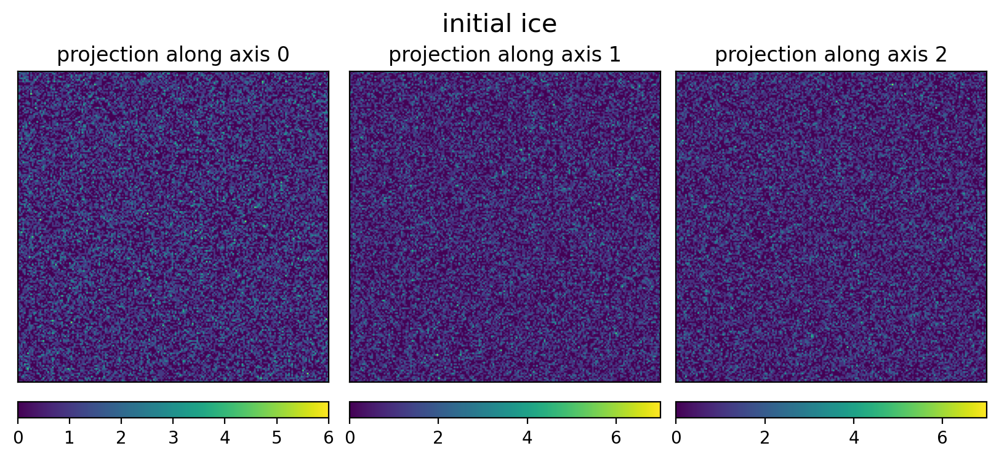

In [12]:
plot3d(prev_ice_vol, title='initial ice')

In [13]:
from scipy.ndimage import maximum_filter, binary_erosion

from skimage.feature import peak_local_max

In [14]:
sz = 10
filtice = maximum_filter(new_ice, sz)
ma = np.max(filtice)
mi = np.min(filtice)
half = (ma - mi) / 2 + mi
filtice[filtice<half] = 0
filtice[filtice>half] = 1
bin_ero = binary_erosion(filtice, structure=np.ones((sz,sz,sz)))

In [15]:
n = 200
peaks = peak_local_max(
                new_ice.numpy(),
                num_peaks=pm.icemaker.n_ice_molecules,
                min_distance=3,
                exclude_border=False,
            )

ice_vol = torch.zeros(n, n, n)
for peak in peaks:
    ice_vol[*peak] = 1

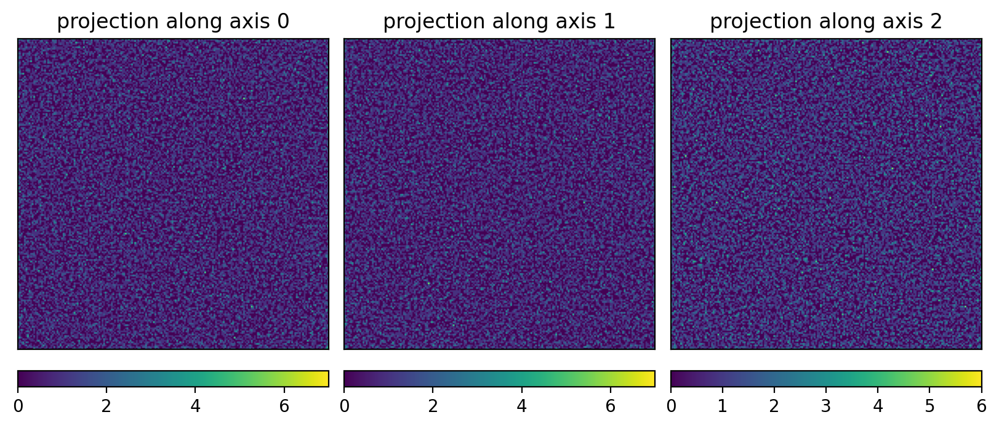

In [16]:
plot3d(ice_vol)

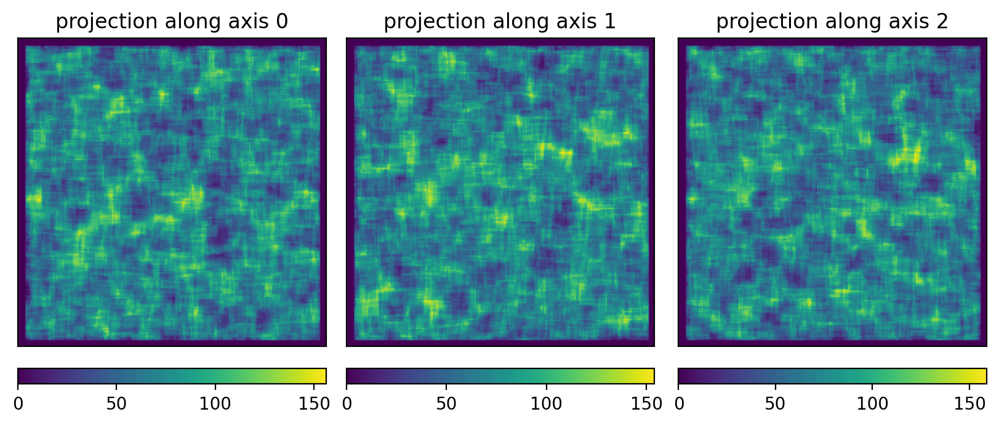

In [17]:
plot3d(bin_ero)

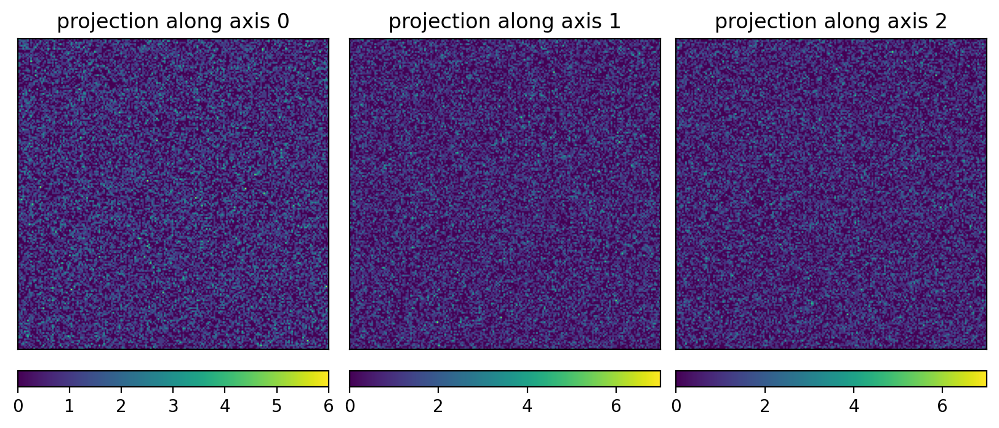

In [18]:
plot3d(prev_ice_vol)

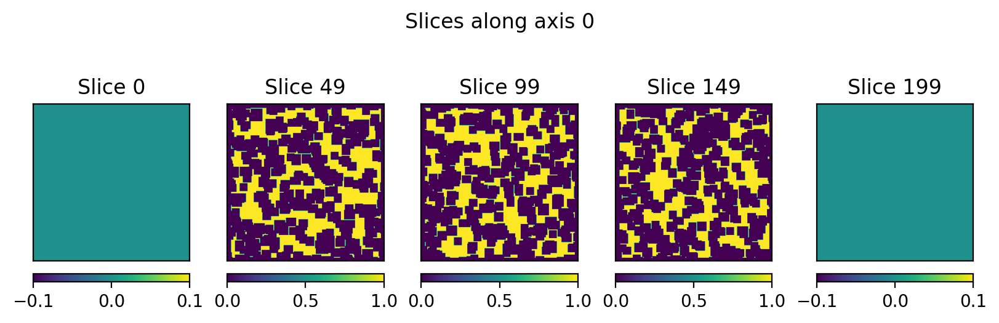

In [19]:
plot_slices(bin_ero)

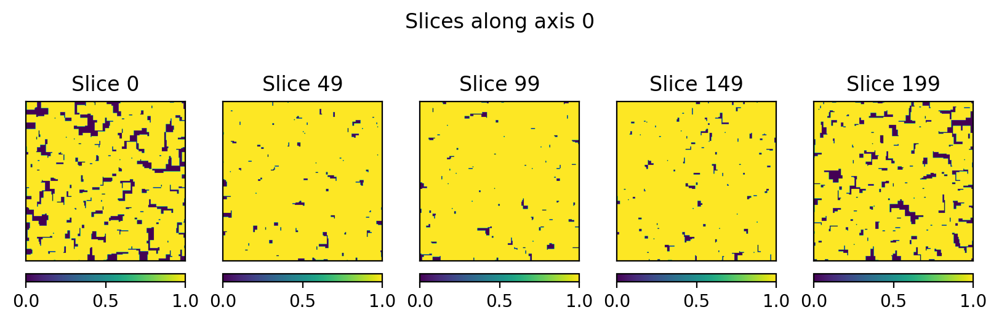

In [20]:
plot_slices(filtice)

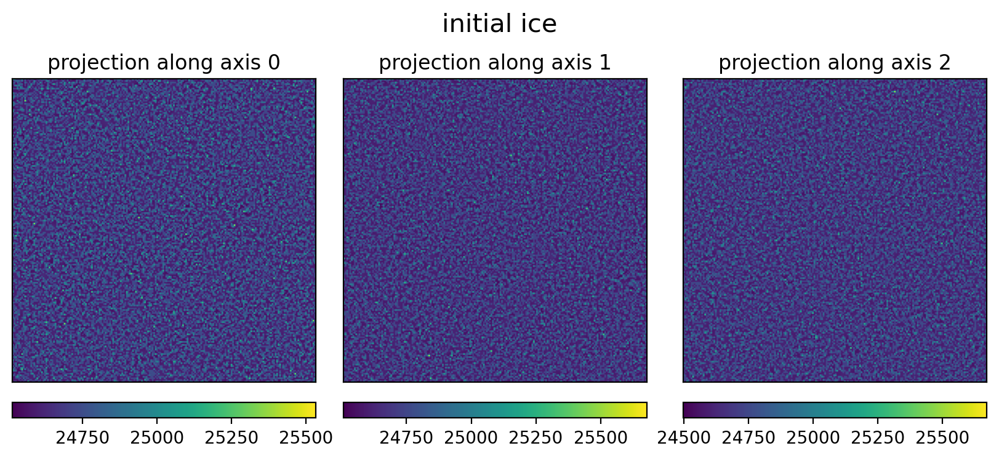

In [21]:
plot3d(new_ice, title='initial ice')

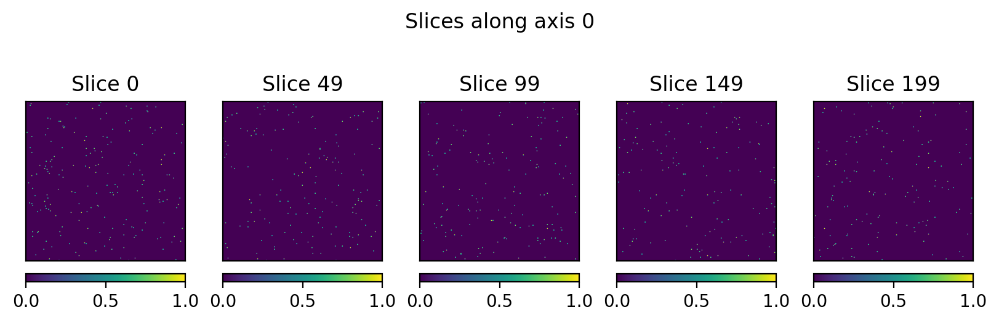

In [22]:
plot_slices(prev_ice_vol)

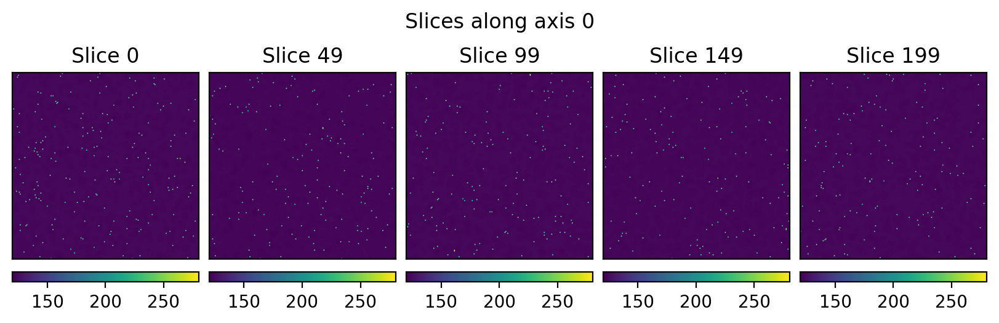

In [23]:
plot_slices(new_ice)

In [24]:
test = new_ice - new_ice.median()
test[test<50] = 0
test[test>50] = 1

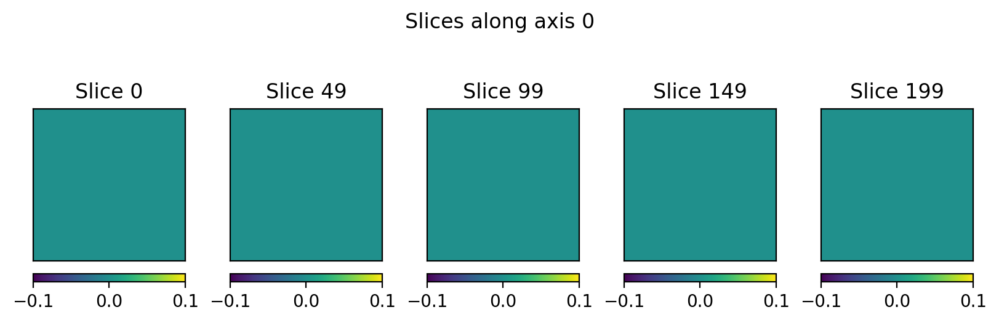

In [25]:
plot_slices(test - prev_ice_vol)

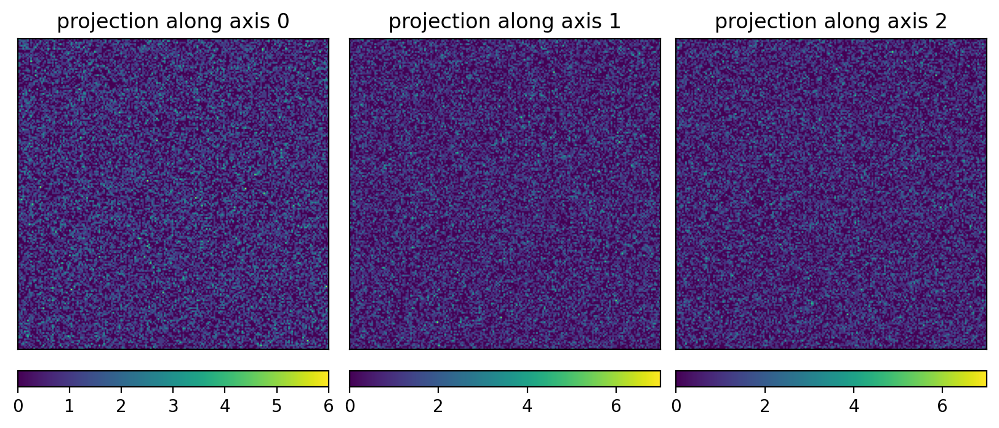

In [26]:
plot3d(test)

In [27]:
torch.allclose(test, prev_ice_vol)

True